In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso,Ridge

In [2]:
df_clear_data = pd.read_csv("dataset/spotify_clear_data.csv")

In [3]:
X_train, X_test, y_train, y_test = train_test_split(df_clear_data.iloc[:, :16], df_clear_data.iloc[:, 16], test_size=0.3, random_state=42)

In [4]:
train_df = X_train.copy()
train_df["category_name"] = y_train

train_df["mood"] = train_df["category_name"].map({"relax": 0, "active": 1})
train_df

,id,name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity,category_name,mood
7685,685glMCresRk1Yvy50O1wO,Sona,0.988000,0.192,150026,0.00115,0.943000,2.0,0.1260,-39.222,0.0,0.0423,68.981,4.0,0.0588,65,relax,0
777,0szIFWz9JGVQazcjI5edd1,Lights Down,0.000586,0.704,206769,0.96900,0.877000,7.0,0.0852,-3.465,1.0,0.0617,129.989,4.0,0.2570,33,active,1
8223,0n2SEXB2qoRQg171q7XqeW,Smooth (feat. Rob Thomas),0.160000,0.609,294986,0.92300,0.000005,9.0,0.2950,-3.908,1.0,0.0338,115.996,4.0,0.9610,74,relax,0
12320,5t34pVFdmAjwMXlCOzxJyy,La Frontera,0.683000,0.664,340616,0.54200,0.339000,7.0,0.3760,-9.595,0.0,0.0433,91.009,4.0,0.6140,47,relax,0
10240,01twL64hJwU3kAiSsUsIVa,I Choose You,0.312000,0.488,180040,0.44500,0.000000,0.0,0.0997,-6.559,1.0,0.0261,157.873,4.0,0.2890,52,active,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5191,4rQSve8YG1CJyzscsodWrh,Evolving,0.973000,0.210,156185,0.00788,0.829000,6.0,0.1080,-31.908,1.0,0.0433,119.863,3.0,0.0496,43,active,1
13418,1zPaYQuwGXyQQbxbLzmIFf,Bırakman Doğru Mu 2,0.704000,0.699,201613,0.55700,0.000000,8.0,0.2880,-9.171,0.0,0.1070,88.004,4.0,0.4850,59,active,1
5390,59COzThWJAOeIM6SBItYZI,Whole Family (feat. Flo Milli),0.015500,0.904,146086,0.69100,0.000000,10.0,0.1480,-5.365,0.0,0.4450,114.915,4.0,0.6020,58,active,1
860,7exHHOSg7JZ7BSmkeP5HaY,Get On Down,0.000946,0.882,185760,0.86100,0.453000,6.0,0.0152,-6.114,0.0,0.0520,124.998,4.0,0.7060,52,active,1


In [5]:
df_without_string_column = train_df.drop(["category_name","name","id"], axis=1)
corr_matrix = df_without_string_column.corr()

In [6]:
corr_matrix

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity,mood
acousticness,1.000000,-0.474505,-0.091462,-0.823676,0.471032,-0.056348,-0.185438,-0.711656,0.123489,-0.167986,-0.267985,-0.206745,-0.386230,-0.149314,-0.297422
danceability,-0.474505,1.000000,-0.009135,0.433584,-0.447674,0.058769,-0.146249,0.647641,-0.140232,0.227878,0.145189,0.259083,0.587543,0.125143,0.311590
duration_ms,-0.091462,-0.009135,1.000000,0.070076,-0.044713,-0.009977,-0.063527,0.100968,-0.015991,-0.099397,0.030726,0.037103,-0.042695,-0.130321,-0.023492
energy,-0.823676,0.433584,0.070076,1.000000,-0.466117,0.077062,0.293373,0.764637,-0.146124,0.162997,0.291740,0.205597,0.433199,0.133794,0.270055
instrumentalness,0.471032,-0.447674,-0.044713,-0.466117,1.000000,-0.036186,-0.007092,-0.686223,0.113382,-0.174432,-0.223055,-0.187905,-0.451728,-0.202573,-0.227634
key,-0.056348,0.058769,-0.009977,0.077062,-0.036186,1.000000,0.015740,0.073837,-0.156765,0.025739,0.014488,0.015061,0.053845,0.000321,0.039139
liveness,-0.185438,-0.146249,-0.063527,0.293373,-0.007092,0.015740,1.000000,0.057605,-0.027619,0.077312,-0.005201,-0.024070,-0.058876,0.018272,-0.025611
loudness,-0.711656,0.647641,0.100968,0.764637,-0.686223,0.073837,0.057605,1.000000,-0.160120,0.155357,0.306805,0.244371,0.515759,0.146264,0.339735
mode,0.123489,-0.140232,-0.015991,-0.146124,0.113382,-0.156765,-0.027619,-0.160120,1.000000,-0.034974,-0.033321,-0.058114,-0.092258,0.041967,-0.092264
speechiness,-0.167986,0.227878,-0.099397,0.162997,-0.174432,0.025739,0.077312,0.155357,-0.034974,1.000000,0.100239,0.059702,0.143651,0.072250,0.139257


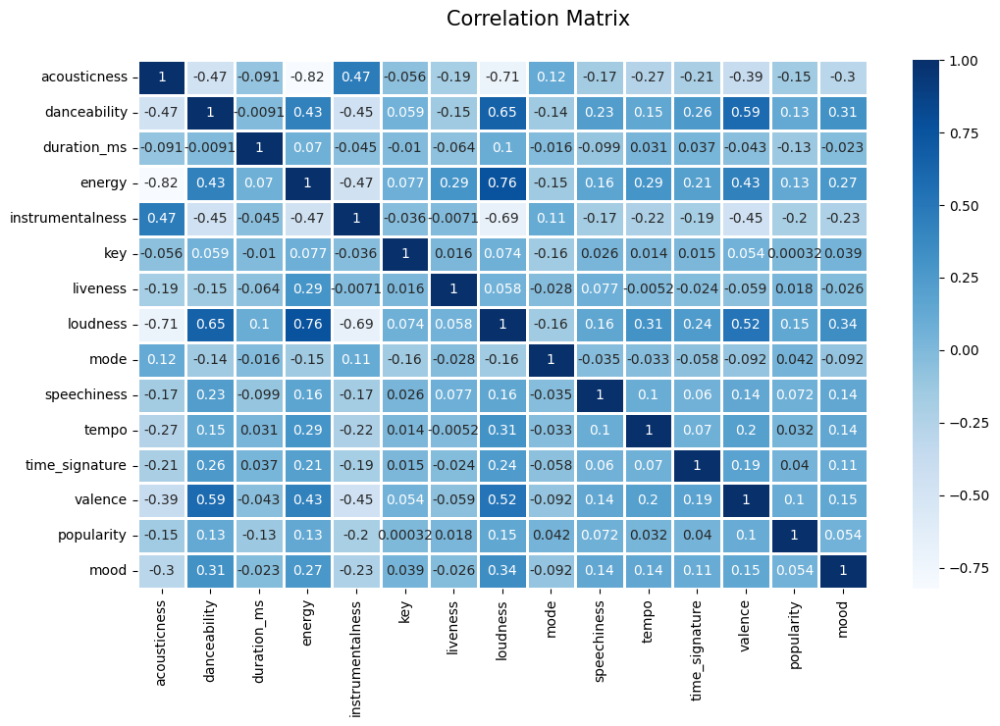

In [7]:
plt.figure(figsize=(12,7))
sns.heatmap(corr_matrix, cmap="Blues", annot=True, linewidths=1) 
plt.title("Correlation Matrix", size= 15, y=1.05, x = 0.55)
plt.savefig("Corr_Matrix.png", dpi = 300)
plt.show()

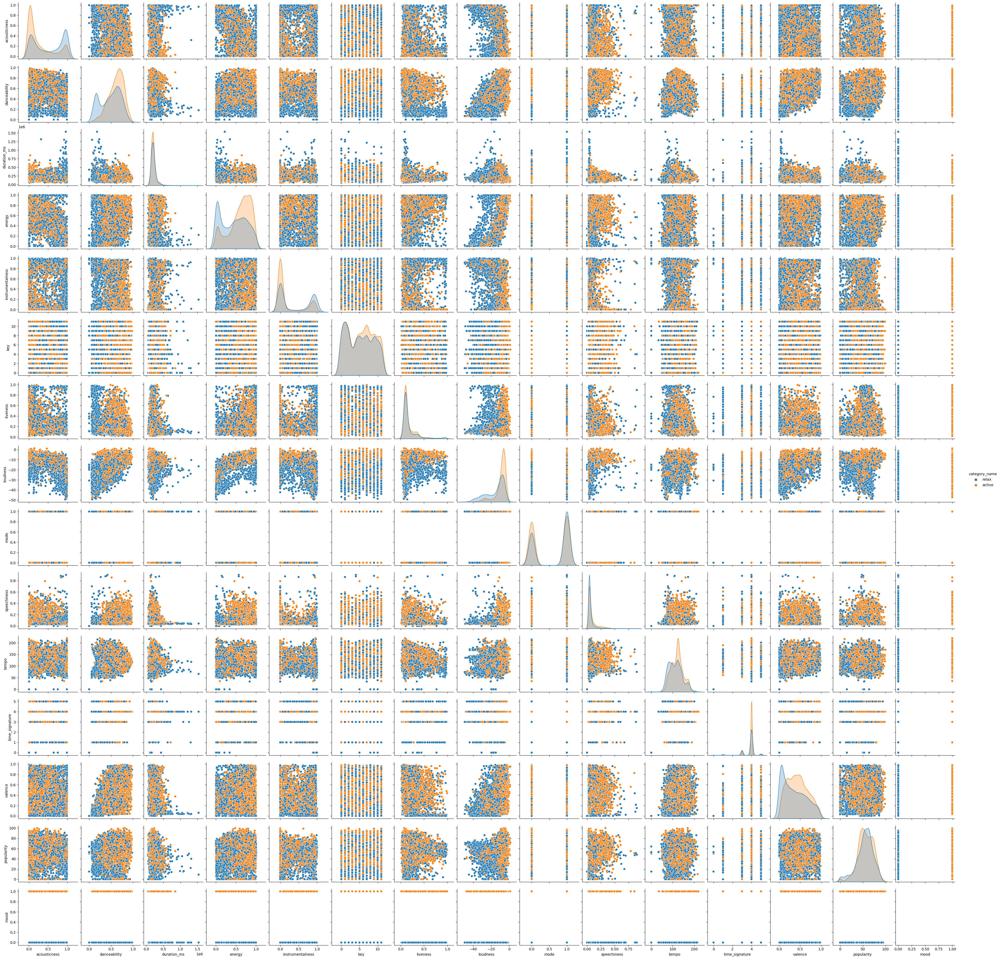

In [8]:
sns.pairplot(train_df, hue="category_name")

<AxesSubplot: xlabel='mode', ylabel='category_name'>

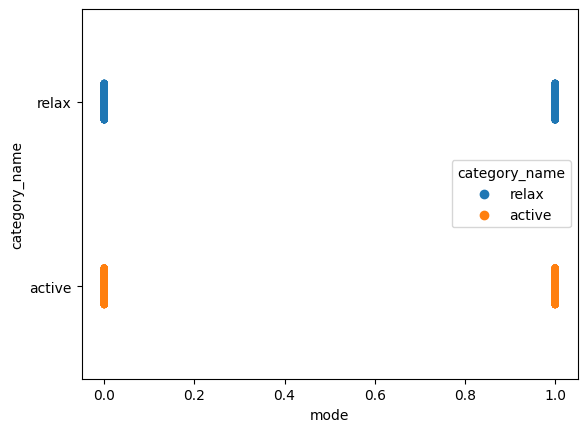

In [9]:
sns.stripplot(x="mode", y="category_name", data=train_df, alpha=0.6, hue="category_name")

<AxesSubplot: xlabel='energy', ylabel='category_name'>

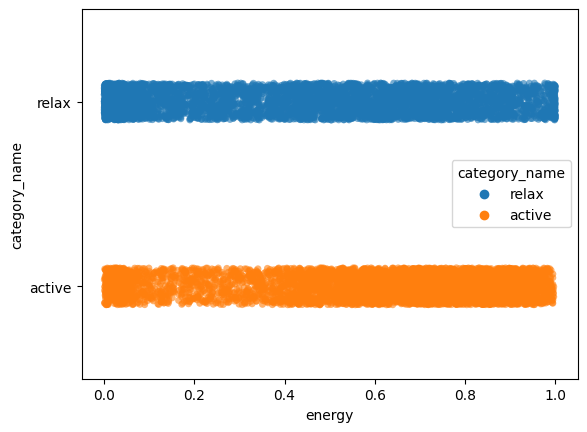

In [10]:
sns.stripplot(x="energy", y="category_name", data=train_df, alpha=0.6, hue="category_name")

<AxesSubplot: xlabel='instrumentalness', ylabel='category_name'>

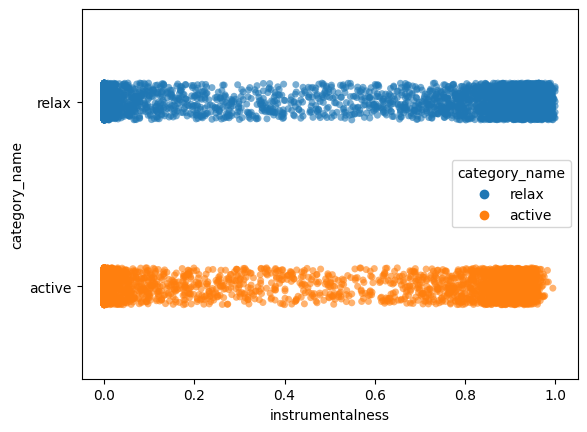

In [11]:
sns.stripplot(x="instrumentalness", y="category_name", data=train_df, alpha=0.6, hue="category_name")

<AxesSubplot: xlabel='acousticness', ylabel='category_name'>

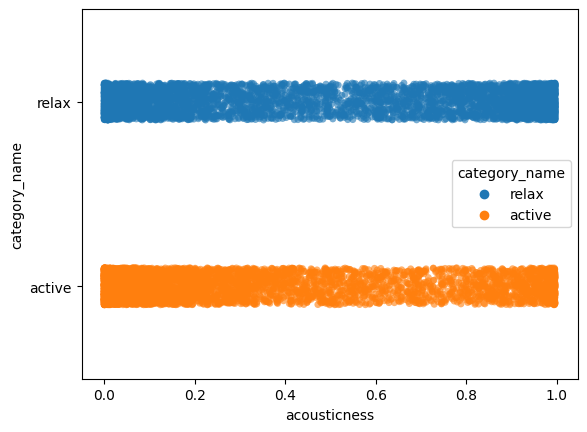

In [12]:
sns.stripplot(x="acousticness", y="category_name", data=train_df, alpha=0.6, hue="category_name")

<AxesSubplot: xlabel='time_signature', ylabel='category_name'>

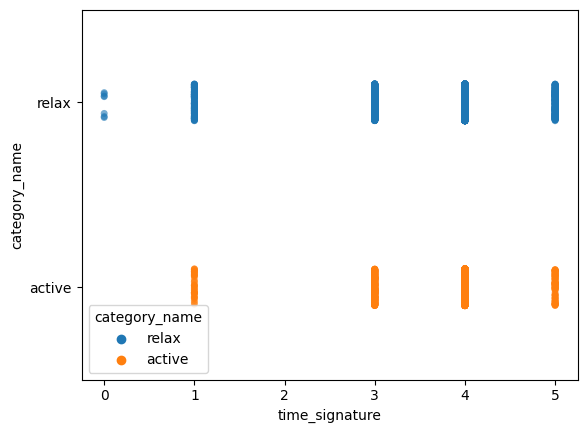

In [13]:
sns.stripplot(x="time_signature", y="category_name", data=train_df, alpha=0.6, hue="category_name")

<AxesSubplot: xlabel='danceability', ylabel='category_name'>

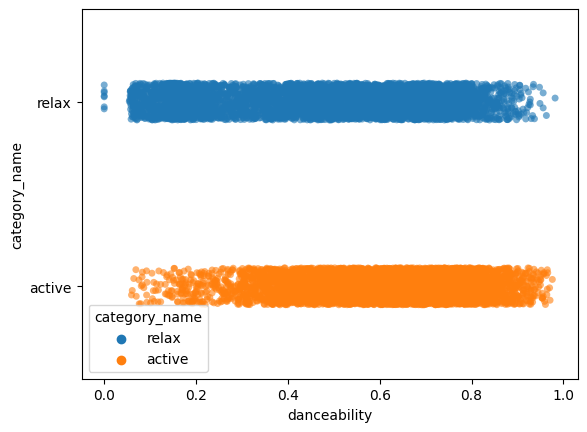

In [14]:
sns.stripplot(x="danceability", y="category_name", data=train_df, alpha=0.6, hue="category_name")

In [15]:
# X ve Y değişkenlerimizi oluşturma
X = train_df.loc[:,["mode", "time_signature", "danceability", "energy"]]
y = train_df["mood"]

# Train/Test Ayrımı
X_train, x_test, Y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train/Validation Ayrımı
x_train, x_val, y_train, y_val = train_test_split(X_train, Y_train, test_size=0.25, random_state=42)

In [16]:
lreg = LinearRegression()

lreg.fit(x_train, y_train)

pred = lreg.predict(x_val)

# MSE Hesabı
mse = np.mean((pred - y_val)**2)
print("MSE: ", mse)

# R2 Skor
print("R2 Score: ", lreg.score(x_val, y_val))

MSE:  0.21572262463887704
R2 Score:  0.13567427580151503


In [17]:
# X ve Y değişkenlerimizi oluşturma
X = train_df.loc[:,["mode"]]
y = train_df["mood"]

# Train/Test Ayrımı
X_train, x_test, Y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train/Validation Ayrımı
x_train, x_val, y_train, y_val = train_test_split(X_train, Y_train, test_size=0.25, random_state=42)

In [18]:
lreg = LinearRegression()

lreg.fit(x_train, y_train)

pred = lreg.predict(x_val)

# MSE Hesabı
mse = np.mean((pred - y_val)**2)
print("MSE: ", mse)

# R2 Skor
print("R2 Score: ", lreg.score(x_val, y_val))

MSE:  0.24914139014577266
R2 Score:  0.0017768751606672684


In [19]:
# X ve Y değişkenlerimizi oluşturma
X = train_df.loc[:,["time_signature"]]
y = train_df["mood"]

# Train/Test Ayrımı
X_train, x_test, Y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train/Validation Ayrımı
x_train, x_val, y_train, y_val = train_test_split(X_train, Y_train, test_size=0.25, random_state=42)

In [20]:
lreg = LinearRegression()

lreg.fit(x_train, y_train)

pred = lreg.predict(x_val)

# MSE Hesabı
mse = np.mean((pred - y_val)**2)
print("MSE: ", mse)

# R2 Skor
print("R2 Score: ", lreg.score(x_val, y_val))

MSE:  0.2464211175539493
R2 Score:  0.012676063791813297


In [21]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["mode", "time_signature", "danceability", "energy"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %65.11
Naive Bayes -> ACC: %64.85
Decision Tree (CART) -> ACC: %56.92
K-NN -> ACC: %62.39
SVM -> ACC: %65.31
Gradient Boosting Classifier -> ACC: %66.07
AdaBoostClassifier -> ACC: %65.70
BaggingClassifier -> ACC: %60.66
RandomForestClassifier -> ACC: %62.89
MLPClassifier -> ACC: %66.46


In [22]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["mode"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %53.57
Naive Bayes -> ACC: %53.57
Decision Tree (CART) -> ACC: %53.57
K-NN -> ACC: %52.03
SVM -> ACC: %53.57
Gradient Boosting Classifier -> ACC: %53.57
AdaBoostClassifier -> ACC: %53.57
BaggingClassifier -> ACC: %53.57
RandomForestClassifier -> ACC: %53.57
MLPClassifier -> ACC: %53.57


In [23]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["mode", "energy"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %63.25
Naive Bayes -> ACC: %62.82
Decision Tree (CART) -> ACC: %57.74
K-NN -> ACC: %58.39
SVM -> ACC: %62.98
Gradient Boosting Classifier -> ACC: %64.07
AdaBoostClassifier -> ACC: %64.16
BaggingClassifier -> ACC: %57.74
RandomForestClassifier -> ACC: %58.56
MLPClassifier -> ACC: %63.08


In [24]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["mode", "danceability"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %61.77
Naive Bayes -> ACC: %62.30
Decision Tree (CART) -> ACC: %58.69
K-NN -> ACC: %58.79
SVM -> ACC: %63.57
Gradient Boosting Classifier -> ACC: %62.56
AdaBoostClassifier -> ACC: %62.30
BaggingClassifier -> ACC: %57.90
RandomForestClassifier -> ACC: %58.07
MLPClassifier -> ACC: %63.48


In [25]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["energy", "danceability"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %65.34
Naive Bayes -> ACC: %65.15
Decision Tree (CART) -> ACC: %58.56
K-NN -> ACC: %61.31
SVM -> ACC: %66.46
Gradient Boosting Classifier -> ACC: %65.87
AdaBoostClassifier -> ACC: %65.93
BaggingClassifier -> ACC: %60.49
RandomForestClassifier -> ACC: %61.21
MLPClassifier -> ACC: %66.49


In [26]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["loudness"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %64.36
Naive Bayes -> ACC: %63.93
Decision Tree (CART) -> ACC: %57.61
K-NN -> ACC: %60.59
SVM -> ACC: %64.56
Gradient Boosting Classifier -> ACC: %65.08
AdaBoostClassifier -> ACC: %64.49
BaggingClassifier -> ACC: %56.39
RandomForestClassifier -> ACC: %56.95
MLPClassifier -> ACC: %65.38


In [27]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["acousticness", "energy", "danceability", "instrumentalness", "loudness", "mode", "tempo", "time_signature"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %66.43
Naive Bayes -> ACC: %64.82
Decision Tree (CART) -> ACC: %59.28
K-NN -> ACC: %59.90
SVM -> ACC: %64.00
Gradient Boosting Classifier -> ACC: %66.98
AdaBoostClassifier -> ACC: %66.10
BaggingClassifier -> ACC: %65.48
RandomForestClassifier -> ACC: %66.79
MLPClassifier -> ACC: %65.48


In [28]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["acousticness", "energy", "danceability", "instrumentalness", "loudness", "mode", "tempo", "time_signature", "popularity"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression(max_iter=1000)))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %66.30
Naive Bayes -> ACC: %64.82
Decision Tree (CART) -> ACC: %62.16
K-NN -> ACC: %62.26
SVM -> ACC: %64.20
Gradient Boosting Classifier -> ACC: %68.39
AdaBoostClassifier -> ACC: %67.38
BaggingClassifier -> ACC: %67.51
RandomForestClassifier -> ACC: %69.93
MLPClassifier -> ACC: %67.18


In [29]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["acousticness", "energy", "danceability", "instrumentalness"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression(max_iter=1000)))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %66.20
Naive Bayes -> ACC: %65.74
Decision Tree (CART) -> ACC: %59.74
K-NN -> ACC: %62.03
SVM -> ACC: %66.43
Gradient Boosting Classifier -> ACC: %67.08
AdaBoostClassifier -> ACC: %66.46
BaggingClassifier -> ACC: %62.20
RandomForestClassifier -> ACC: %64.43
MLPClassifier -> ACC: %67.34


In [30]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Sınıflandırma fonksiyonu
def categorize_category(category):
    if category == "active":
        return "Active"
    else:
        return "Relax"

df_clear_data['Category_Class'] = df_clear_data['category_name'].apply(categorize_category)

# X ve Y değişkenlerini oluşturma
X = df_clear_data.loc[:,["acousticness", "energy", "danceability", "instrumentalness", "tempo"]]
y = df_clear_data["Category_Class"]

# Train/Test Ayrımı
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Modelleri tanımlama
models = []
models.append(('Logistic Regression', LogisticRegression(max_iter=1000)))
models.append(('Naive Bayes', GaussianNB()))
models.append(('Decision Tree (CART)', DecisionTreeClassifier())) 
models.append(('K-NN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('BaggingClassifier', BaggingClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('MLPClassifier', MLPClassifier()))

# Modelleri döngü ile deneme
for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    from sklearn import metrics

    print("%s -> ACC: %%%.2f" % (name, metrics.accuracy_score(y_test, y_pred) * 100))

Logistic Regression -> ACC: %65.93
Naive Bayes -> ACC: %65.93
Decision Tree (CART) -> ACC: %58.36
K-NN -> ACC: %61.48
SVM -> ACC: %58.98
Gradient Boosting Classifier -> ACC: %67.02
AdaBoostClassifier -> ACC: %66.07
BaggingClassifier -> ACC: %63.61
RandomForestClassifier -> ACC: %66.56
MLPClassifier -> ACC: %66.03


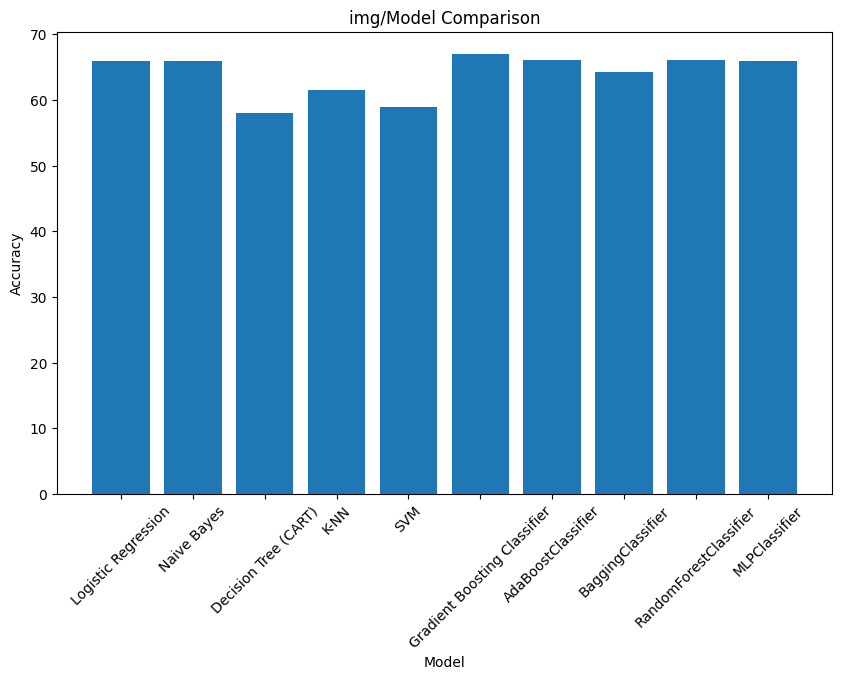

In [31]:
model_names = []
accuracies = []

for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, y_pred) * 100
    model_names.append(name)
    accuracies.append(accuracy)

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies)
plt.xticks(rotation=45)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('img/Model Comparison')
plt.show()

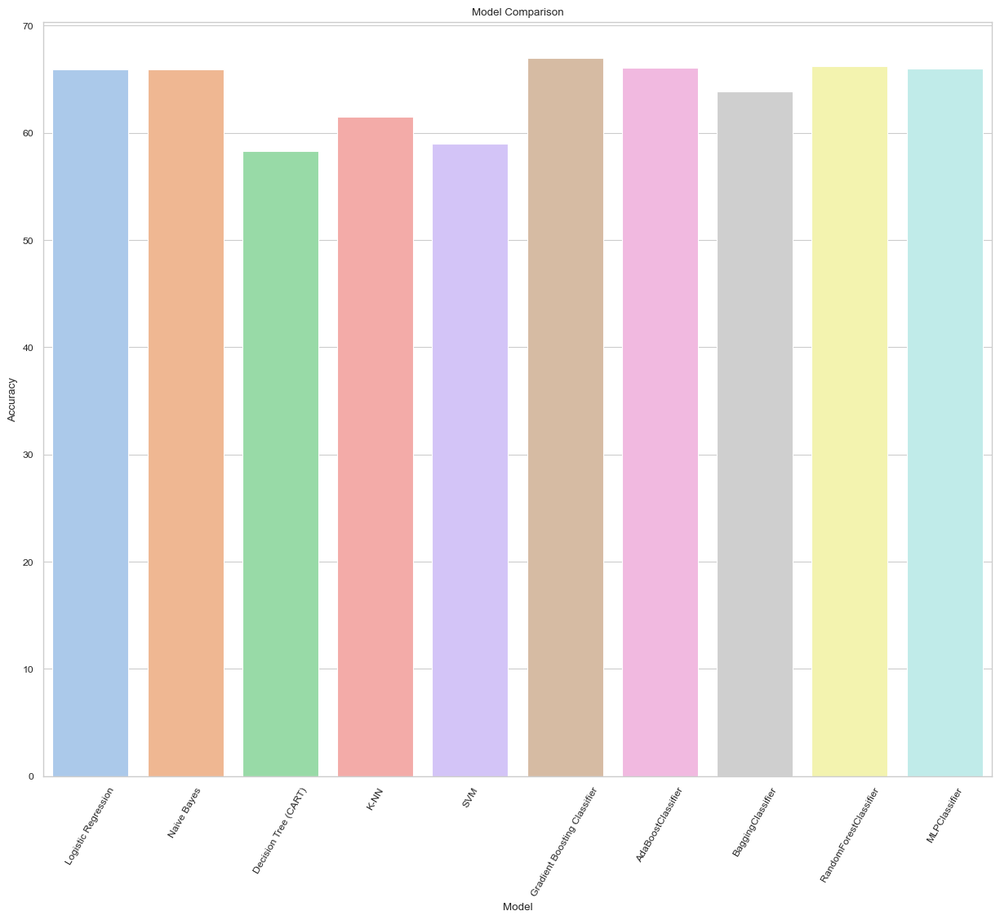

In [32]:
model_names = []
accuracies = []

sns.set_theme()
sns.set_style("whitegrid")
sns.set_context("paper")

for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, y_pred) * 100
    model_names.append(name)
    accuracies.append(accuracy)

data = pd.DataFrame({'Model': model_names, 'Accuracy': accuracies})

colors = sns.color_palette('pastel')

plt.figure(figsize=(15, 12))
sns.barplot(x='Model', y='Accuracy', data=data, palette=colors)
plt.xticks(rotation=60)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Model Comparison')

plt.savefig("img/Model_Comparison_pastel.png", dpi = 300)
plt.show()

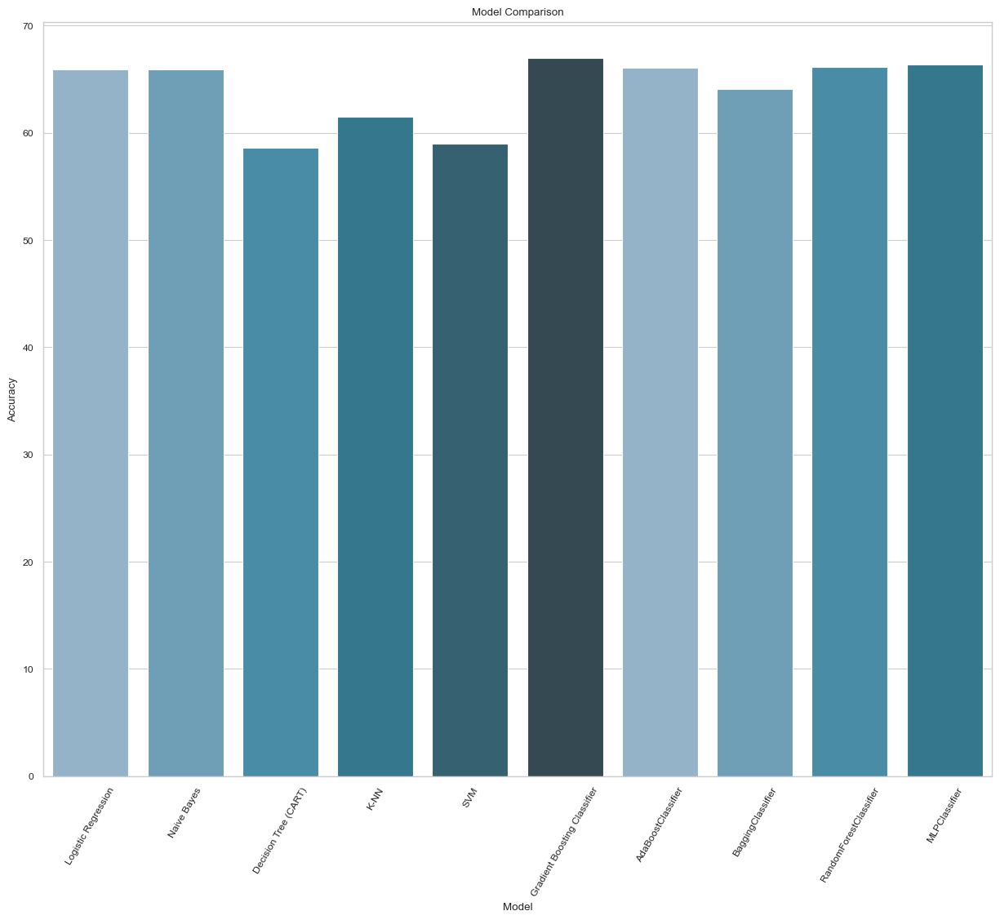

In [33]:
plt.figure(figsize=(15, 12))

model_names = []
accuracies = []

for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, y_pred) * 100
    model_names.append(name)
    accuracies.append(accuracy)

data = pd.DataFrame({"Model": model_names, "Accuracy": accuracies})

colors = sns.color_palette("PuBuGn_d")

sns.set_theme()
sns.set_style("whitegrid")
sns.set_context("paper")
sns.barplot(x="Model", y="Accuracy", data=data, palette=colors)
plt.xticks(rotation=60)
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.title("Model Comparison")

#plt.savefig("img/Model_Comparison.png", dpi = 300)
plt.show()

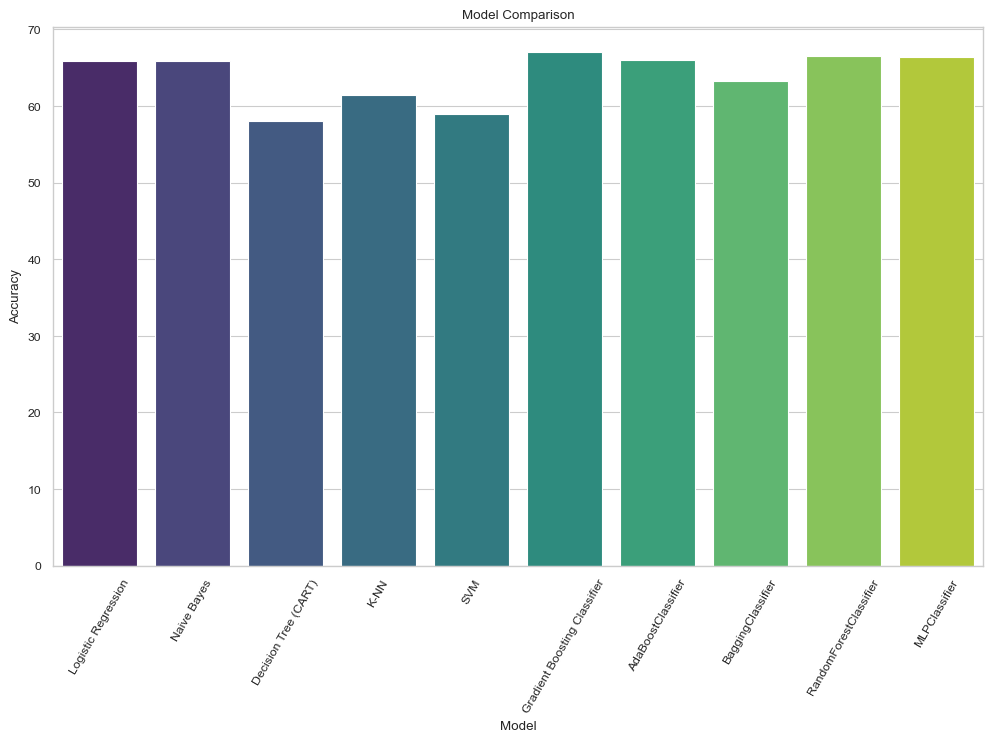

In [34]:
model_names = []
accuracies = []

plt.figure(figsize=(12, 7))

sns.set_theme()
sns.set_style("whitegrid")
sns.set_context("paper")

for name, model in models:
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, y_pred) * 100
    model_names.append(name)
    accuracies.append(accuracy)

data = pd.DataFrame({'Model': model_names, 'Accuracy': accuracies})
colors = sns.color_palette('viridis', n_colors=len(model_names))

sns.barplot(x='Model', y='Accuracy', data=data, palette=colors)
plt.xticks(rotation=60)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Model Comparison')

plt.savefig("img/Model_Comparison_viridis.png", dpi=300)
plt.show()

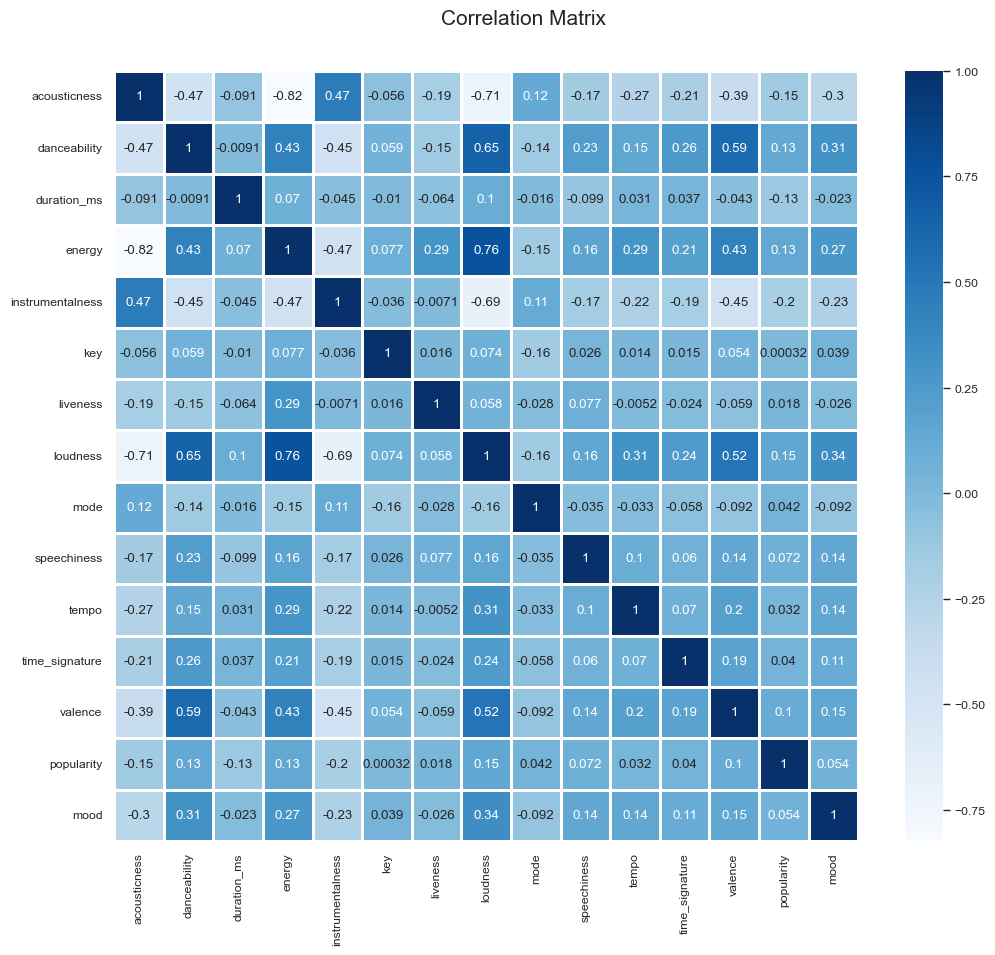

In [35]:
plt.figure(figsize=(12, 10))

sns.heatmap(corr_matrix, cmap="Blues", annot=True, linewidths=1)
plt.title("Correlation Matrix", size=15, y=1.05, x=0.55)
plt.savefig("img/Corr_Matrix.png", dpi=450)
plt.show()

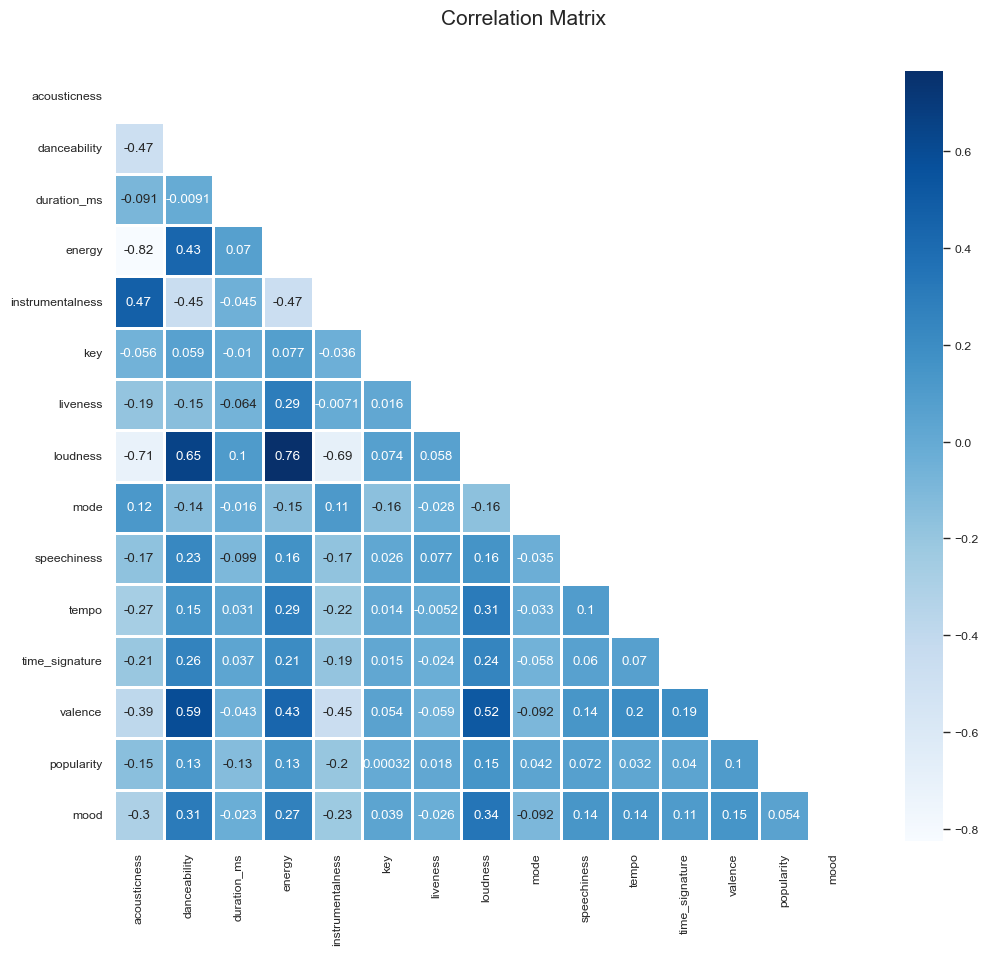

In [36]:
plt.figure(figsize=(12, 10))

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(corr_matrix, mask=mask, cmap="Blues", annot=True, linewidths=1)
plt.title("Correlation Matrix", size=15, y=1.05, x=0.55)
plt.savefig("img/Corr_Matrix_mask.png", dpi=450)
plt.show()

---